In [2]:
import cv2
import numpy as np
from shapely import geometry

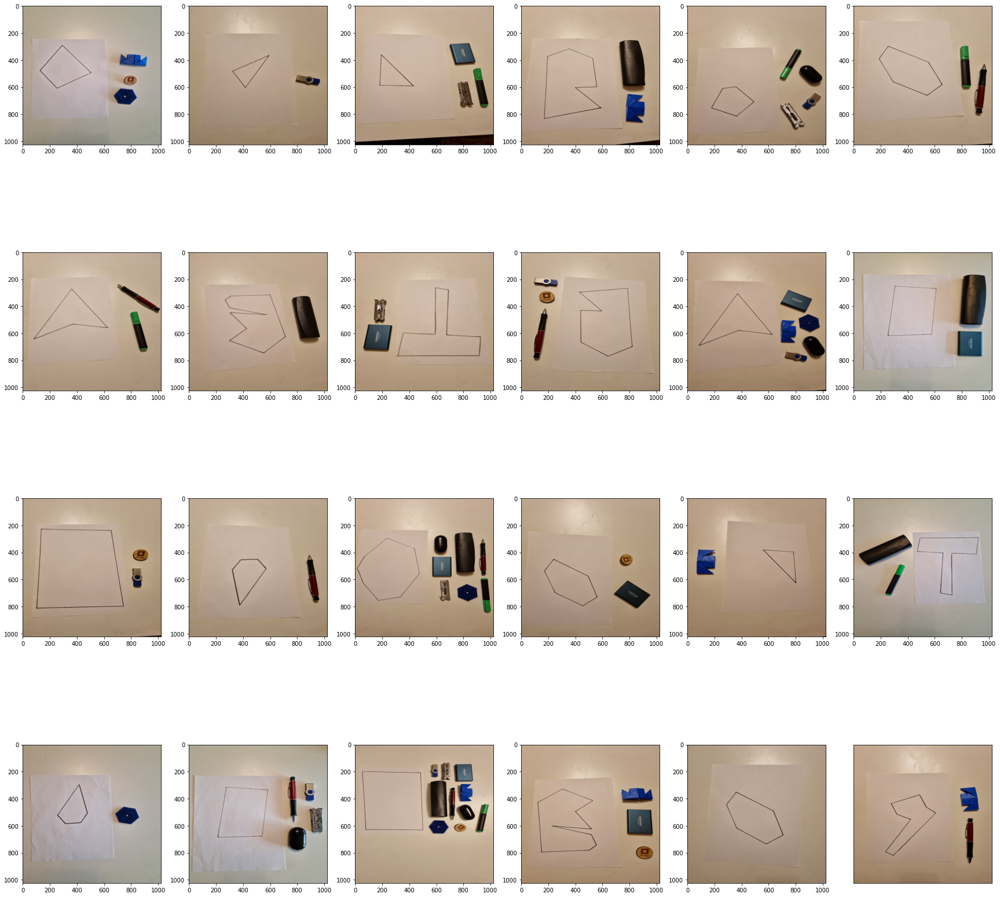

In [291]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

directory = "../Data/Examples/"

fig = plt.figure(figsize = [30, 30])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])

        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2RGB)

        axs[i // 6][i % 6].imshow(img_gray)
        plt.xticks([]),plt.yticks([])

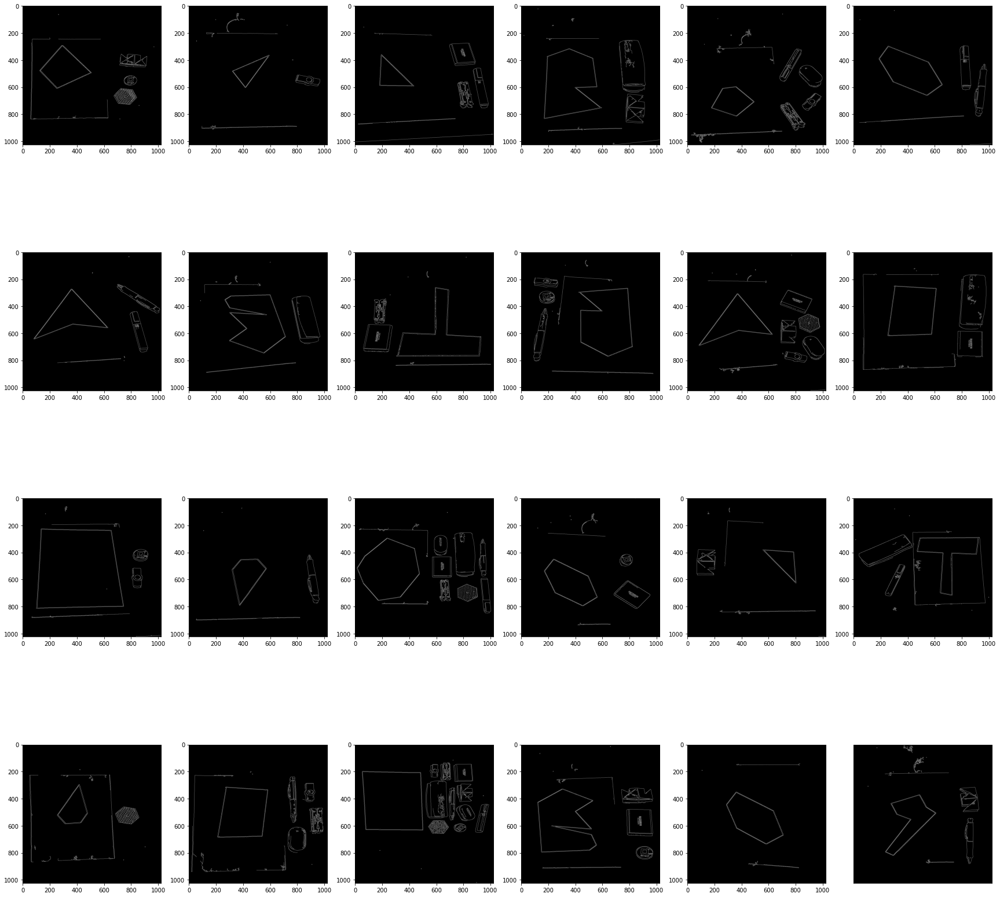

In [86]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

directory = "../Data/Examples/"

fig = plt.figure(figsize = [30, 30])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])

        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2GRAY)
        img_gauss = cv.GaussianBlur(img_gray, (5, 5), 0)

        img_canny = cv.Canny(img_gauss, 0, 70)

        #contours, hierarchy = cv.findContours(img_canny, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
        #cv.drawContours(img_canny, contours, -1, (255,255,255), 3)

        axs[i // 6][i % 6].imshow(img_canny, 'gray')
        plt.xticks([]),plt.yticks([])

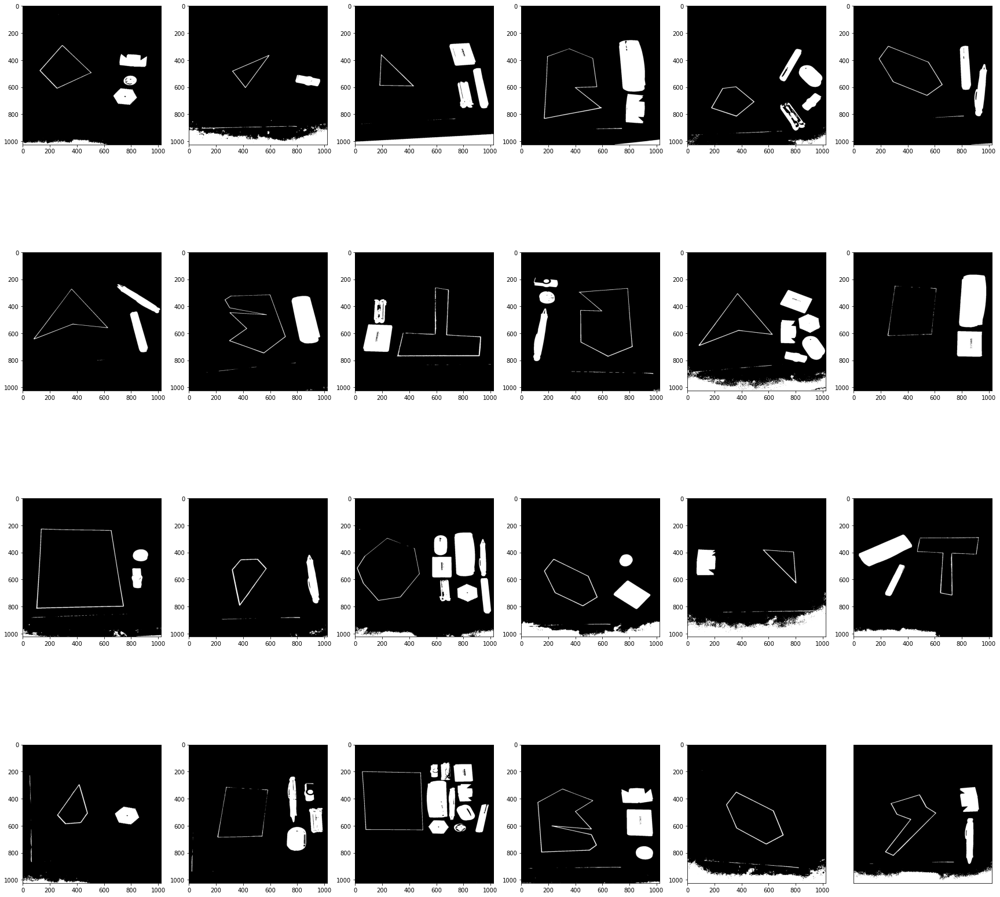

In [93]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage as ndi

directory = "../Data/Examples/"

fig = plt.figure(figsize = [30, 30])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])

        #img_norm = normalize_image(image)
        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2GRAY)
        img_gauss = cv.GaussianBlur(img_gray, (5, 5), 0)

        #threshold image
        res_threshold, img_threshold = cv.threshold(img_gauss, 135, 255, cv.THRESH_BINARY)
        res = (img_gauss <= res_threshold).astype(np.uint8)

        axs[i // 6][i % 6].imshow(res,'gray')
        plt.xticks([]),plt.yticks([])

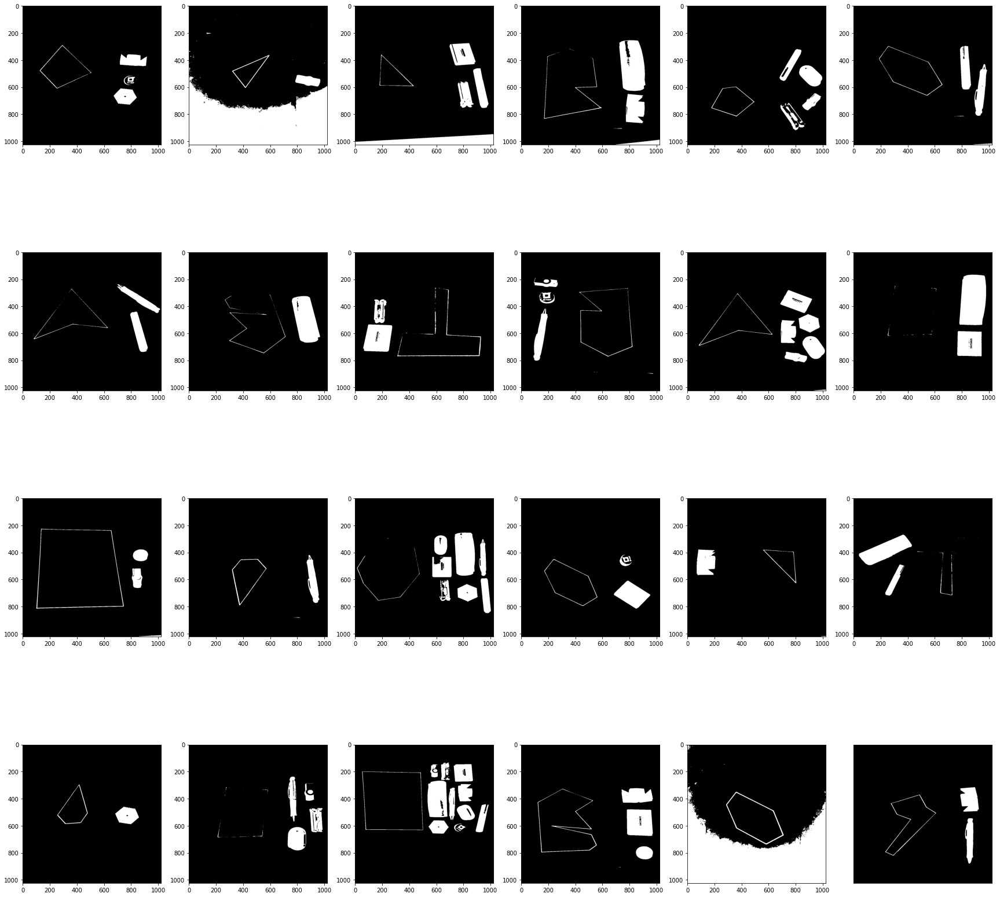

In [96]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage as ndi
from skimage.filters import threshold_otsu

directory = "../Data/Examples/"

fig = plt.figure(figsize = [30, 30])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])

        #img_norm = normalize_image(image)
        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2GRAY)
        img_gauss = cv.GaussianBlur(img_gray, (5, 5), 0)

        #threshold image
        res_threshold = threshold_otsu(img_gauss)
        res = (img_gauss <= res_threshold).astype(np.uint8)

        #contours, hierarchy = cv.findContours(res_threshold, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
        #cv.drawContours(res_threshold, contours, -1, (255,255,255), 3)

        axs[i // 6][i % 6].imshow(res,'gray')
        plt.xticks([]),plt.yticks([])

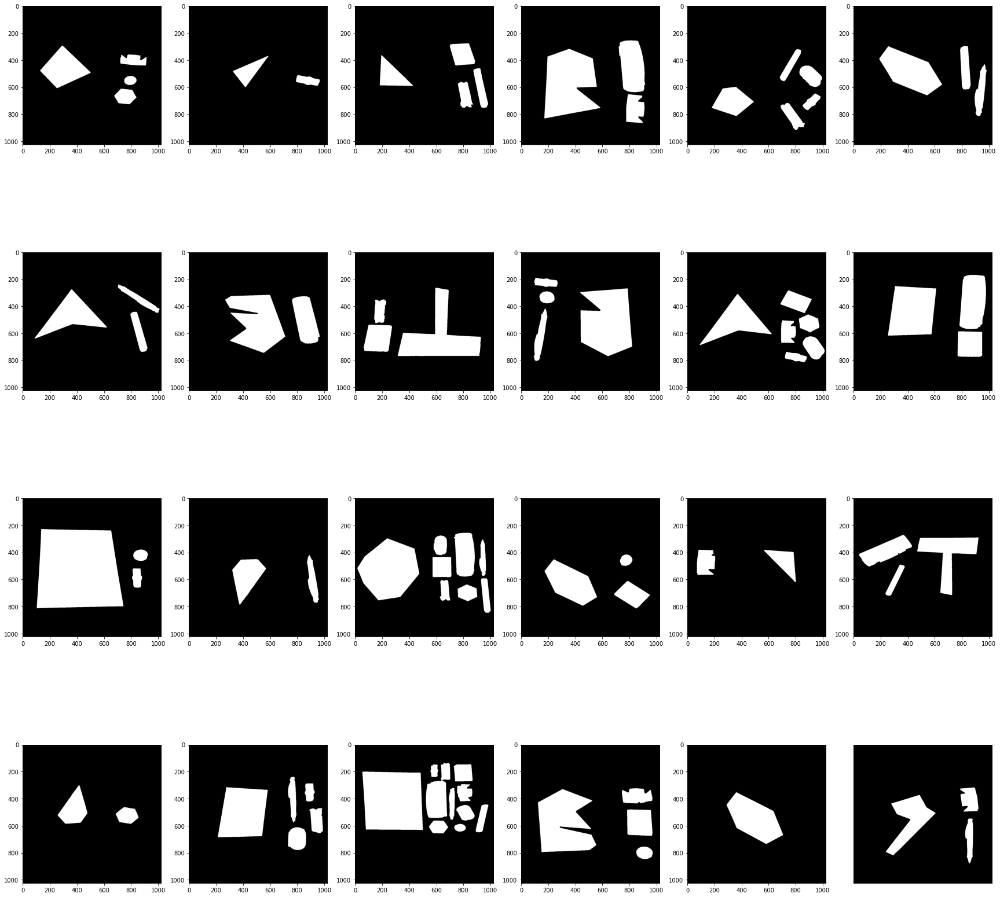

In [151]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects

directory = "../Data/Examples/"

def correct_mask_borders_after_canny(canny_result, border_width=3):
    canny_result[:border_width,:] = 0
    canny_result[:,:border_width] = 0
    canny_result[-border_width:,:] = 0
    canny_result[:,-border_width:] = 0

fig = plt.figure(figsize = [30, 30])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])

        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2GRAY)
        img_gauss = cv.GaussianBlur(img_gray, (5, 5), 0)

        img_canny = cv.Canny(img_gauss, 10, 50)

        #correct_mask_borders_after_canny(img_canny)

        res = ndi.binary_closing(img_canny, structure=np.ones((5, 5)))
        res = ndi.binary_fill_holes(res)
        res = ndi.binary_erosion(res, structure=np.ones((5, 5)))
        res = ndi.binary_opening(res, iterations=1, structure=np.ones((10, 10)))
        res = remove_small_objects(res, 3000)

        #contours, hierarchy = cv.findContours(img_canny, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
        #cv.drawContours(img_canny, contours, -1, (255,255,255), 3)

        axs[i // 6][i % 6].imshow(res, 'gray')
        plt.xticks([]),plt.yticks([])

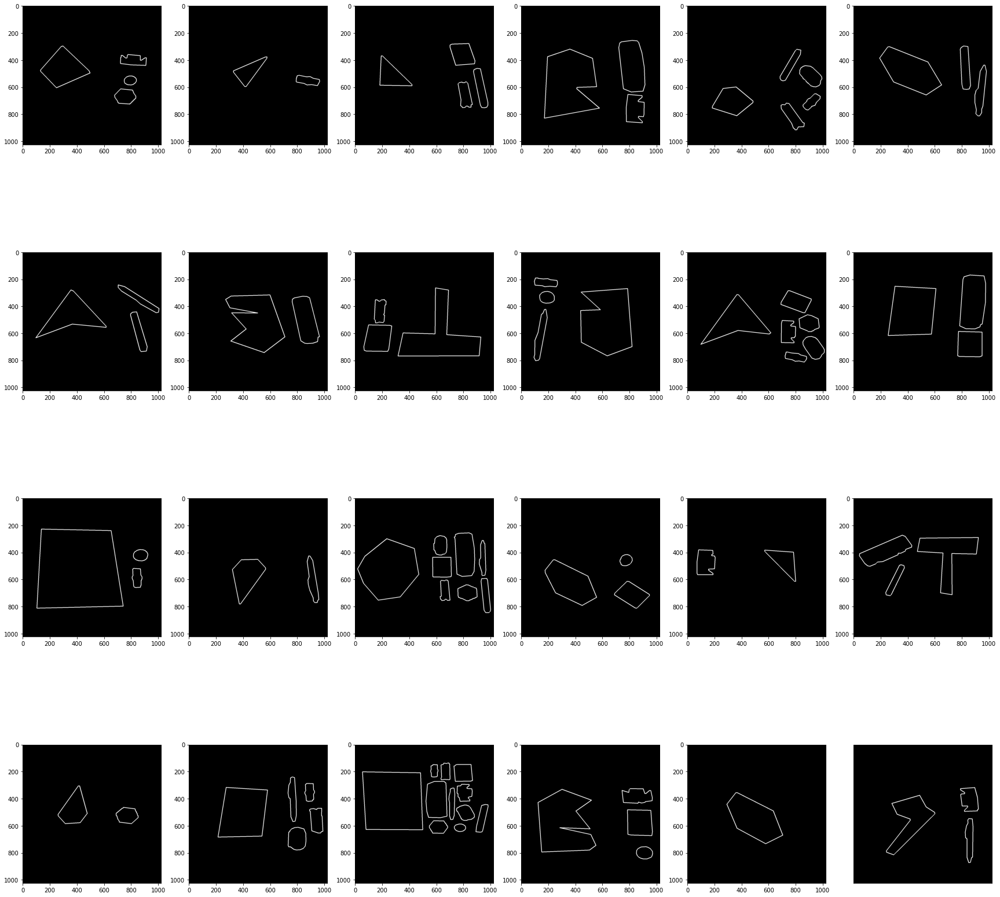

In [153]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects

directory = "../Data/Examples/"

fig = plt.figure(figsize = [30, 30])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])

        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2GRAY)
        img_gauss = cv.GaussianBlur(img_gray, (5, 5), 0)

        img_canny = cv.Canny(img_gauss, 10, 50)

        res = ndi.binary_closing(img_canny, structure=np.ones((5, 5)))
        res = ndi.binary_fill_holes(res)
        res = ndi.binary_erosion(res, structure=np.ones((5, 5)))
        res = ndi.binary_opening(res, iterations=1, structure=np.ones((10, 10)))
        res = remove_small_objects(res, 3000)

        obj_contour = np.zeros_like(res, np.uint8)
        contours, hierarchy = cv.findContours(res.astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
        for cnt in contours:
            epsilon = 0.005*cv.arcLength(cnt,True)
            approx = cv.approxPolyDP(cnt,epsilon,True)
            #print('approx', cnt)
            cv.drawContours(obj_contour, [approx], 0, (255,255,255), 3)

        axs[i // 6][i % 6].imshow(obj_contour, 'gray')
        plt.xticks([]),plt.yticks([])

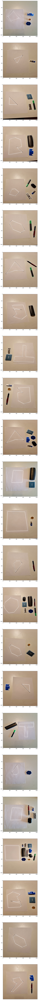

In [4]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects

directory = "../Data/Examples/"

fig = plt.figure(figsize = [10, 240])
axs = fig.subplots(24, 1)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])

        img_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
        img_gauss = cv.GaussianBlur(img_gray, (5, 5), 0)

        img_canny = cv.Canny(img_gauss, 10, 50)

        res = ndi.binary_closing(img_canny, structure=np.ones((5, 5)))
        res = ndi.binary_fill_holes(res)
        res = ndi.binary_erosion(res, structure=np.ones((5, 5)))
        res = ndi.binary_opening(res, iterations=1, structure=np.ones((10, 10)))
        res = remove_small_objects(res, 3000)

        #obj_contour = np.zeros_like(res, np.uint8)
        contours, hierarchy = cv.findContours(res.astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
        for cnt in contours:
            epsilon = 0.01*cv.arcLength(cnt,True)
            approx = cv.approxPolyDP(cnt,epsilon,True)
            #print('approx', cnt)
            cv.drawContours(image, [approx], 0, (255,255,255), 3)

        axs[i].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
        plt.xticks([]),plt.yticks([])

In [248]:
def find_all_contours(img_gray):
    img_gauss = cv.GaussianBlur(img_gray, (5, 5), 0)

    img_canny = cv.Canny(img_gauss, 10, 50)

    res = ndi.binary_closing(img_canny, structure=np.ones((5, 5)))
    res = ndi.binary_fill_holes(res)
    res = ndi.binary_erosion(res, structure=np.ones((5, 5)))
    res = ndi.binary_opening(res, iterations=1, structure=np.ones((10, 10)))
    res = remove_small_objects(res, 3000)

    contours, hierarchy = cv.findContours(res.astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    return contours

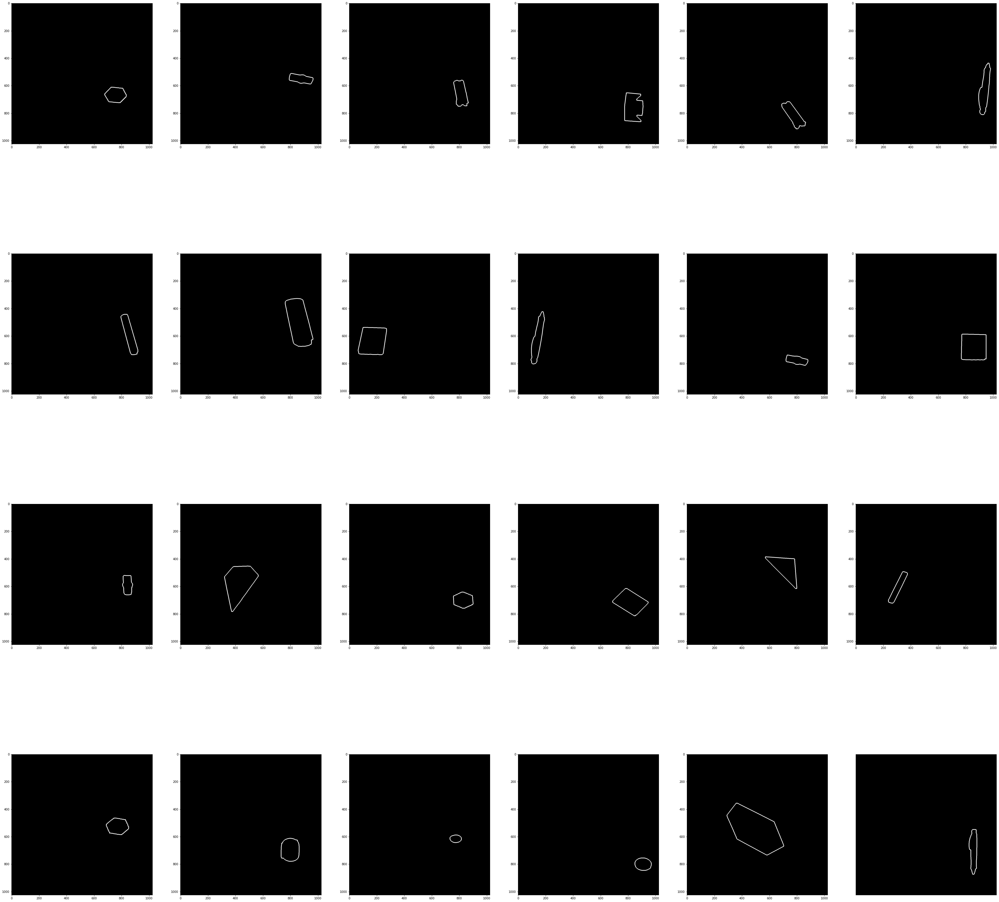

In [302]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects

directory = "../Data/Examples/"

fig = plt.figure(figsize = [60, 60])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])
        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2GRAY)

        contours = find_all_contours(img_gray)
        obj_contour = np.zeros_like(image, np.uint8)

        means = []
        dev = []
        mean_img = cv.mean(image, mask=np.ones(img_gray.shape, np.uint8))
        for cnt in contours:
            mask = np.zeros(img_gray.shape, np.uint8)
            cv2.drawContours(mask, c, -1, 255, -1)
            mean, stddev =  cv.meanStdDev(image, mask=mask)
            #means.append(max([255 - mean[0], 255 - mean[1], 255 - mean[2]]))
            means.append(max([mean_img[0] - mean[0], mean_img[0] - mean[1], mean_img[0] - mean[2]]))
            dev.append(stddev[0])
        #print()
        #print(means)

        contour = np.zeros_like(image, np.uint8)
        #cv.drawContours(contour, [contours[means.index(max(means))]], 0, (255,255,255), 3)
        cv.drawContours(contour, [contours[means.index(min(means))]], 0, (255,255,255), 3)

        axs[i // 6][i % 6].imshow(contour, 'gray')
        plt.xticks([]),plt.yticks([])

[18.8560809]
[39.71010775]
[25.8193438]
[15.34560557]

[28.99120041]
[19.89049744]

[24.02680544]
[24.73567927]
[20.0706998]
[23.64726614]

[24.04013208]
[37.83382744]
[52.62098073]

[30.20098154]
[21.74344374]
[10.15249266]
[36.69529069]
[35.44357565]

[37.30106646]
[17.88095825]
[29.33242437]

[29.68840041]
[26.10111382]
[27.35322805]

[32.44639636]
[19.59960933]

[39.55933709]
[34.83953516]
[20.96225038]

[31.88036065]
[25.88004721]
[21.03450845]
[56.03012521]

[28.20997233]
[27.39614957]
[22.74895147]
[29.89296914]
[20.03324222]
[26.53720056]

[37.67418547]
[21.34364822]
[50.10698758]

[34.01240322]
[25.80269221]
[15.98266978]

[15.14241296]
[24.22499507]

[21.96659038]
[34.86553738]
[26.14540056]
[35.05897809]
[35.93163275]
[50.97925528]
[42.76416444]
[48.82685022]

[25.48659807]
[12.15281719]
[29.84671491]

[21.02029512]
[23.3543567]

[47.19493096]
[25.94991692]
[54.28916079]

[36.6554755]
[16.15079935]

[27.49270876]
[61.16635296]
[22.5584187]
[47.51278775]
[45.66389091]

[34.24

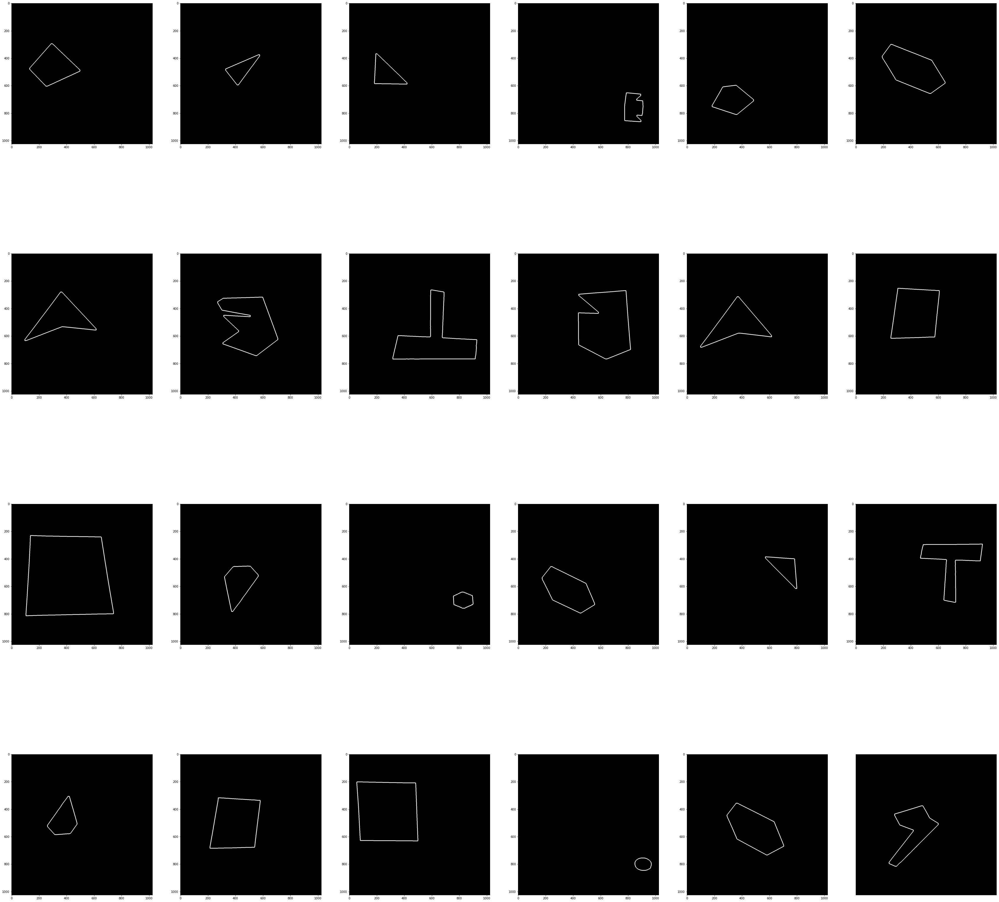

In [285]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects

directory = "../Data/Examples/"

fig = plt.figure(figsize = [60, 60])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])
        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2GRAY)

        contours = find_all_contours(img_gray)
        obj_contour = np.zeros_like(image, np.uint8)

        means = []
        dev = []
        #mean_img = cv.mean(img_gray, mask=np.ones(img_gray.shape, np.uint8))
        for cnt in contours:
            mask = np.zeros(img_gray.shape, np.uint8)
            cv2.drawContours(mask, cnt, -1, 255, -1)
            mean, stddev =  cv.meanStdDev(img_gray, mask=mask)
            print(stddev[0])
            #means.append(mean_img[0] - mean[0])
            dev.append(stddev[0])
        print()
        #print(means)

        contour = np.zeros_like(image, np.uint8)
        cv.drawContours(contour, [contours[dev.index(min(dev))]], 0, (255,255,255), 3)

        axs[i // 6][i % 6].imshow(contour, 'gray')
        plt.xticks([]),plt.yticks([])


[array([1.]), array([0.58415842]), array([1.]), array([0.9375])]

[array([1.]), array([0.99719101])]

[array([0.92261905]), array([0.996337]), array([0.98148148]), array([0.99056604])]

[array([0.98230088]), array([0.6185567]), array([0.71326165])]

[array([0.92207792]), array([0.94890511]), array([1.]), array([0.74712644]), array([0.93582888])]

[array([0.90128755]), array([0.93377483]), array([0.96183206])]

[array([0.99093656]), array([0.65869565]), array([0.97635934])]

[array([0.85788114]), array([0.70094723])]

[array([0.97674419]), array([0.92592593]), array([0.79746835])]

[array([0.94539249]), array([0.75373134]), array([0.9]), array([0.675])]

[array([0.96774194]), array([0.85462555]), array([0.98717949]), array([1.]), array([0.85984848]), array([0.95488722])]

[array([0.39622642]), array([0.12946429]), array([0.75102041])]

[array([1.]), array([1.]), array([1.])]

[array([1.]), array([0.95289855])]

[array([1.]), array([0.77319588]), array([1.]), array([0.97222222]), array(

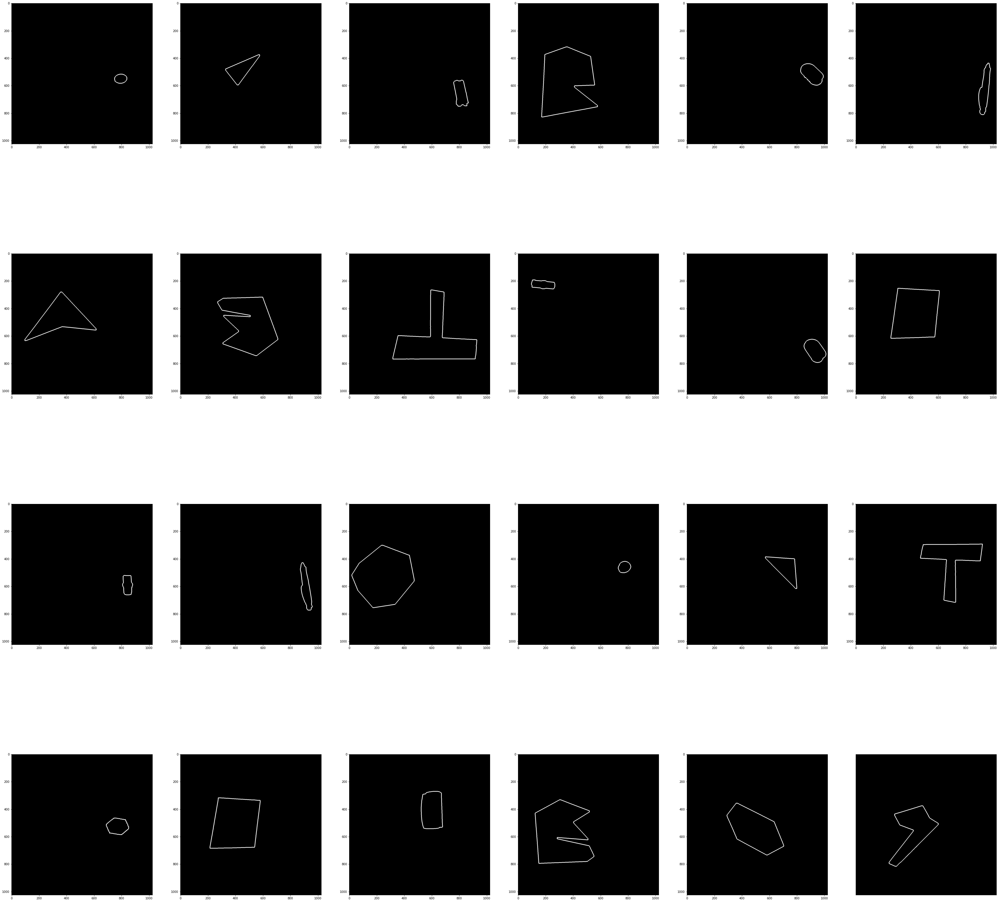

In [295]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects
from skimage.filters import threshold_otsu

directory = "../Data/Examples/"

fig = plt.figure(figsize = [60, 60])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])
        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2GRAY)

        contours = find_all_contours(img_gray)
        obj_contour = np.zeros_like(image, np.uint8)

        #threshold image
        img_gauss = cv.GaussianBlur(img_gray, (5, 5), 0)
        res_threshold = threshold_otsu(img_gauss)
        res = (img_gauss <= res_threshold).astype(np.uint8)

        means = []
        dev = []
        for cnt in contours:
            mask = np.zeros(res.shape, np.uint8)
            cv2.drawContours(mask, cnt, -1, 255, -1)
            mean, stddev =  cv.meanStdDev(res, mask=mask)
            means.append(mean[0])
            dev.append(stddev[0])
        print()
        print(means)

        contour = np.zeros_like(image, np.uint8)
        cv.drawContours(contour, [contours[means.index(min(means))]], 0, (255,255,255), 3)

        axs[i // 6][i % 6].imshow(contour, 'gray')
        plt.xticks([]),plt.yticks([])

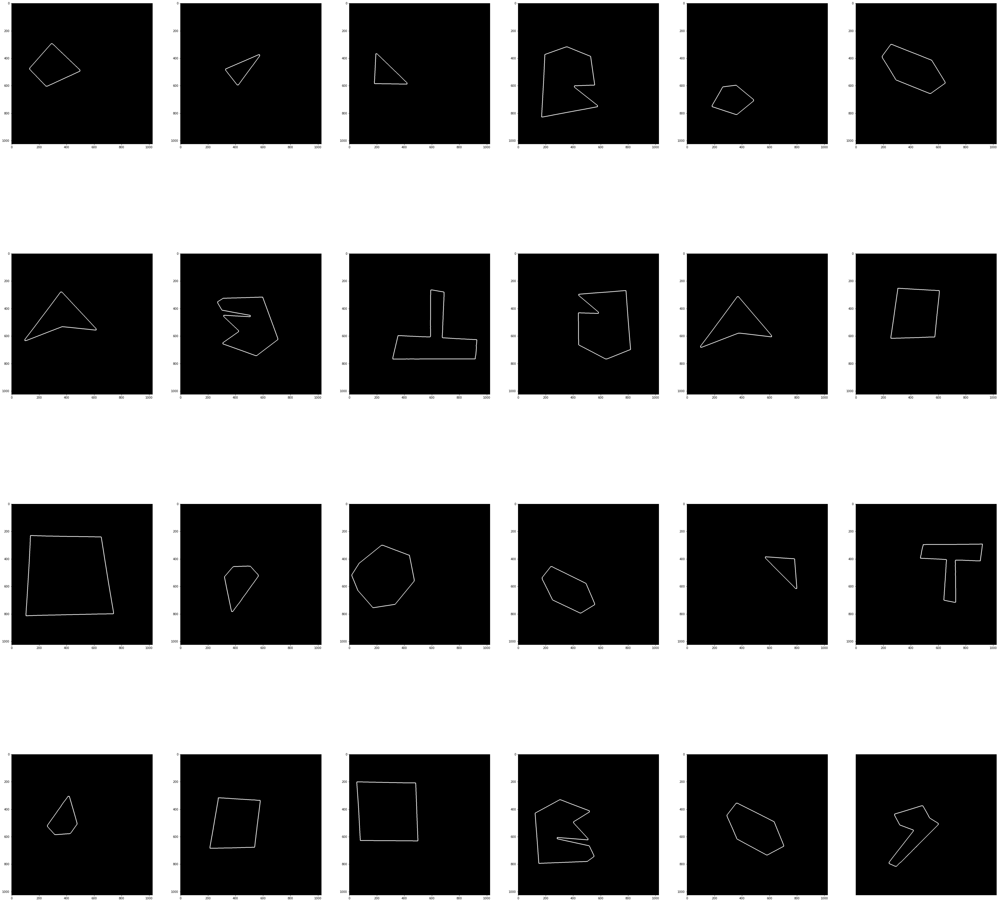

In [303]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects

directory = "../Data/Examples/"

def scale_contour(cnt, scale):
    M = cv2.moments(cnt)
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])

    cnt_norm = cnt - [cx, cy]
    cnt_scaled = cnt_norm * scale
    cnt_scaled = cnt_scaled + [cx, cy]
    cnt_scaled = cnt_scaled.astype(np.int32)

    return cnt_scaled

fig = plt.figure(figsize = [60, 60])
axs = fig.subplots(4, 6)
for i, filename in enumerate(os.listdir(directory)):
    if (filename.title()[0:3] == 'Exm'):
        image = cv.imread(directory + filename)
        image = cv.resize(image, [1024, 1024])
        img_gray = cv.cvtColor(image, cv2.COLOR_BGR2GRAY)

        contours = find_all_contours(img_gray)
        obj_contour = np.zeros_like(image, np.uint8)

        means = []
        dev = []
        mean_img = cv.mean(image, mask=np.ones(img_gray.shape, np.uint8))
        for cnt in contours:
            c = scale_contour(cnt, 0.8)
            mask = np.zeros(img_gray.shape, np.uint8)
            cv2.drawContours(mask, c, -1, 255, -1)
            mean, stddev =  cv.meanStdDev(image, mask=mask)
            #print(mean, stddev)
            means.append(max([255 - mean[0], 255 - mean[1], 255 - mean[2]]))
            dev.append(stddev[0])
        #print()
        #print(means)

        contour = np.zeros_like(image, np.uint8)
        #cv.drawContours(contour, [contours[means.index(max(means))]], 0, (255,255,255), 3)
        cv.drawContours(contour, [contours[means.index(min(means))]], 0, (255,255,255), 3)

        axs[i // 6][i % 6].imshow(contour, 'gray')
        plt.xticks([]),plt.yticks([])